![Practicum AI Logo image](https://github.com/PracticumAI/practicumai.github.io/blob/main/images/logo/PracticumAI_logo_250x50.png?raw=true)  <img src='images/04/data_optimization.png' align='right' width=50>

# *Practicum AI Data*: Data Optimization - Data Augmentation

This exercise is inspired by Duc Haba (2023) <i>Data Augmentation with Python</i> from <a href="https://www.packtpub.com/product/data-augmentation-with-python/9781803246451?utm_source=github&utm_medium=repository&utm_campaign=9781803246451">Packt Publishers</a> and the <a href="https://github.com/PacktPublishing/Data-Augmentation-with-Python">Software Carpentries</a>. 

***

In this notebook, we will dive deep into the concept of data augmentation and its benefits for machine learning modeling. Throughout this notebook, we will explore the application of data augmentation techniques across diverse data types, including tabular, image, text, and audio data. 

## Objectives

By the end of this notebook, you will be able to:

1. Develop a thorough understanding of data augmentation and its advantages for machine learning modeling
2. Explore the application of data augmentation techniques across various data types such as tabular, image, text, and audio data.

## 1. Introduction

### 1.1 What is Data Augmentation?

**Data augmentation is a method that increases the amount of training data by making changes or creating new data from existing datasets**. It helps prevent overfitting and improves the model's ability to handle different data types during machine learning training. 

By introducing variations or using deep learning models, data augmentation enhances the model's accuracy and adaptability. It is only applied during training, not during testing. Overall, data augmentation expands the training dataset, making the model more robust and accurate.

### 1.2 The Benefits of Data Augmentation

The benefits of data augmentation include:

1. **Enhanced model accuracy**: By introducing variations and diverse examples through data augmentation, the model becomes better at accurately predicting and classifying unseen data instances.

2. **Increased training data**: Data augmentation allows for the expansion of the training dataset, providing the model with more examples to learn from and improving its performance.

3. **Prevention of data scarcity**: Data augmentation helps overcome limitations of insufficient training data by generating additional examples, reducing the risk of the model underperforming due to data scarcity.

4. **Reduced overfitting and improved variability**: By introducing variations and creating diverse data instances, data augmentation helps prevent overfitting, where the model becomes too specific to the training data and performs poorly on new data. It promotes generalization and adaptability.

In addition to these benefits, data augmentation can also help address class imbalance issues in classification tasks, reduce the costs associated with collecting and labeling data, enable rare event prediction, and mitigate data privacy concerns.

## 2. Techniques for Data Augmentation

### 2.1 Tabular Data

Tabular data augmentation is a growing field in machine learning and deep learning. It focuses on enhancing tabular data through techniques like transformations, interactions, mappings, and extractions. These techniques aim to improve the performance and accuracy of machine learning models. By applying tabular augmentation, we can extract more valuable insights and make better predictions based on the data.

In tabular data analysis, the class imbalance problem is a common challenge. It occurs when there is an uneven distribution of classes within the dataset. Traditional approaches suggest adding more data to the minority class. However, in real-world machine learning systems, obtaining additional data may not always be feasible. As an alternative, tabular augmentation techniques, combined with synthetic data generation, offer effective solutions. By balancing the class distribution, these techniques help improve the performance and accuracy of machine learning models on tabular datasets.

Tabular augmentation plays a significant role in enhancing predictive analytics. It involves organizing unstructured tabular data into a structured format, making it more useful for analysis and decision-making. By unlocking the full potential of real-world data, tabular augmentation enables us to gain deeper insights and make informed decisions. The application of tabular augmentation techniques helps optimize data quality, improve model training, and enhance the overall performance of machine learning algorithms in various domains.

<div style="text-align:center">
    <img src="images/04/tabular.webp" width="400">
    <p style="font-style:italic; font-size:12px; text-align:center">Image Source: <a href="https://towardsdatascience.com/smote-synthetic-data-augmentation-for-tabular-data-1ce28090debc" style="text-decoration:none; color:inherit;">Medium</a></p>
</div>

The image displays three different techniques for generating synthetic tabular data: SMOTE (Synthetic Minority Over-sampling Technique), Borderline-SMOTE, and ADASYN (Adaptive Synthetic). In this section, we will perform tabular data augmentation using the scikit-learn library.

**To begin**, let's obtain our tabular dataset. Download the [Coffee Quality Data](https://www.kaggle.com/datasets/fatihb/coffee-quality-data-cqi) from Kaggle and save it in your data folder.

In [1]:
import pandas as pd

df =  pd.read_csv('data/df_arabica_clean.csv')
df.drop('Unnamed: 0', axis = 1, inplace = True) # Drop the unuseful columns

df.head()

,ID,Country of Origin,Farm Name,Lot Number,Mill,ICO Number,Company,Altitude,Region,Producer,...,Total Cup Points,Moisture Percentage,Category One Defects,Quakers,Color,Category Two Defects,Expiration,Certification Body,Certification Address,Certification Contact
0,0,Colombia,Finca El Paraiso,CQU2022015,Finca El Paraiso,NaN,Coffee Quality Union,1700-1930,"Piendamo,Cauca",Diego Samuel Bermudez,...,89.33,11.8,0,0,green,3,"September 21st, 2023",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901
1,1,Taiwan,Royal Bean Geisha Estate,"The 2022 Pacific Rim Coffee Summit,T037",Royal Bean Geisha Estate,NaN,Taiwan Coffee Laboratory,1200,Chiayi,曾福森,...,87.58,10.5,0,0,blue-green,0,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
2,2,Laos,OKLAO coffee farms,"The 2022 Pacific Rim Coffee Summit,LA01",oklao coffee processing plant,NaN,Taiwan Coffee Laboratory,1300,Laos Borofen Plateau,WU TAO CHI,...,87.42,10.4,0,0,yellowish,2,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
3,3,Costa Rica,La Cumbre,CQU2022017,La Montana Tarrazu MIll,NaN,Coffee Quality Union,1900,"Los Santos,Tarrazu",Santa Maria de Dota,...,87.17,11.8,0,0,green,0,"September 21st, 2023",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901
4,4,Colombia,Finca Santuario,CQU2023002,Finca Santuario,NaN,Coffee Quality Union,1850-2100,"Popayan,Cauca",Camilo Merizalde,...,87.08,11.6,0,2,yellow-green,2,"March 5th, 2024",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901


**Next**, to explore our dataset, we can use the `info()` and `nunique()` functions. The `info()` function provides a summary of the dataset, including the data types of each column and the number of non-null values. The `nunique()` function allows us to determine the number of unique values in each column, providing insights into the variability of the data.

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 207 entries, 0 to 206
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     207 non-null    int64  
 1   Country of Origin      207 non-null    object 
 2   Farm Name              205 non-null    object 
 3   Lot Number             206 non-null    object 
 4   Mill                   204 non-null    object 
 5   ICO Number             75 non-null     object 
 6   Company                207 non-null    object 
 7   Altitude               206 non-null    object 
 8   Region                 205 non-null    object 
 9   Producer               206 non-null    object 
 10  Number of Bags         207 non-null    int64  
 11  Bag Weight             207 non-null    object 
 12  In-Country Partner     207 non-null    object 
 13  Harvest Year           207 non-null    object 
 14  Grading Date           207 non-null    object 
 15  Owner 

In [3]:
df.nunique()

ID                       207
Country of Origin         22
Farm Name                172
Lot Number               187
Mill                     162
ICO Number                67
Company                   72
Altitude                  97
Region                   120
Producer                 172
Number of Bags            55
Bag Weight                39
In-Country Partner        21
Harvest Year               7
Grading Date              75
Owner                     80
Variety                   48
Status                     1
Processing Method         10
Aroma                     19
Flavor                    19
Aftertaste                20
Acidity                   19
Body                      17
Balance                   18
Uniformity                 3
Clean Cup                  1
Sweetness                  1
Overall                   21
Defects                    1
Total Cup Points          81
Moisture Percentage       46
Category One Defects       6
Quakers                   11
Color         

As an example of data augmentation, we will select columns from the dataset as a subset to work with.

In [4]:
data = df[['Flavor', 'Aftertaste', 'Acidity', 'Overall', 'Category One Defects']]

data.head()

,Flavor,Aftertaste,Acidity,Overall,Category One Defects
0,8.50,8.42,8.58,8.58,0
1,8.50,7.92,8.00,8.50,0
2,8.42,8.08,8.17,8.33,0
3,8.17,8.17,8.25,8.25,0
4,8.33,8.08,8.25,8.25,0


To check the shape of our subset dataset, we can access the `shape` attribute.

In [5]:
data.shape

(207, 5)

The dataset we are working with consists of 207 rows and 5 columns. For visualizing the data, a histogram graph is a suitable choice as it displays the frequency distribution across ranges.

<AxesSubplot:ylabel='Frequency'>

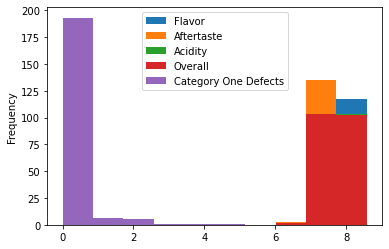

In [6]:
data.plot.hist()

**Lastly**, we will proceed to augment our dataset by using the scikit-learn library.

In [7]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the data into features (X) and target variable (y)
X = data.drop('Category One Defects', axis=1)
y = data['Category One Defects']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform data preprocessing
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Perform data augmentation
num_augmented_samples = 20

# Generate augmented samples by randomly perturbing the original data
augmented_X_train = []
for _ in range(num_augmented_samples):
    perturbed_X = X_train_scaled + np.random.normal(0, 0.1, size=X_train_scaled.shape)
    augmented_X_train.append(perturbed_X)

augmented_X_train = np.array(augmented_X_train)

# Reshape augmented data to match the original shape
augmented_X_train = augmented_X_train.reshape(-1, X_train_scaled.shape[1])

# Repeat the target variable to match the number of augmented samples
augmented_y_train = np.repeat(y_train.values, num_augmented_samples)

# Combine augmented data with original data
augmented_X = np.vstack((X_train_scaled, augmented_X_train))
augmented_y = np.concatenate((y_train, augmented_y_train))

In the provided code, we start by performing data preprocessing through feature scaling using `StandardScaler()` after splitting the data.

To achieve data augmentation, we generate augmented samples by introducing random perturbations to the original training data. Each feature is perturbed using `np.random.normal()`, and this process is repeated for the desired number of augmented samples (*num_augmented_samples*).

Subsequently, we reshape the augmented data to match the shape of the original data, and the target variable (*y_train*) is repeated to align with the number of augmented samples.

Finally, we combine the augmented data (*augmented_X_train*) with the original training data (*X_train_scaled*) using `np.vstack()`, and the augmented target variable (*augmented_y_train*) is concatenated with the original target variable (*y_train*) using `np.concatenate()`. This results in the creation of the augmented dataset (*augmented_X* and *augmented_y*).

Now, let's examine the shape of our augmented dataset.

In [8]:
augmented_df = pd.DataFrame(augmented_X, columns=X.columns)
augmented_df['Category One Defects'] = augmented_y

augmented_df.shape

(3465, 5)

Based on the results, we can see that our dataset has grown from 207 rows to 3465 rows. If you prefer, we can also use scatter plots in Python to visually compare the original and augmented datasets.

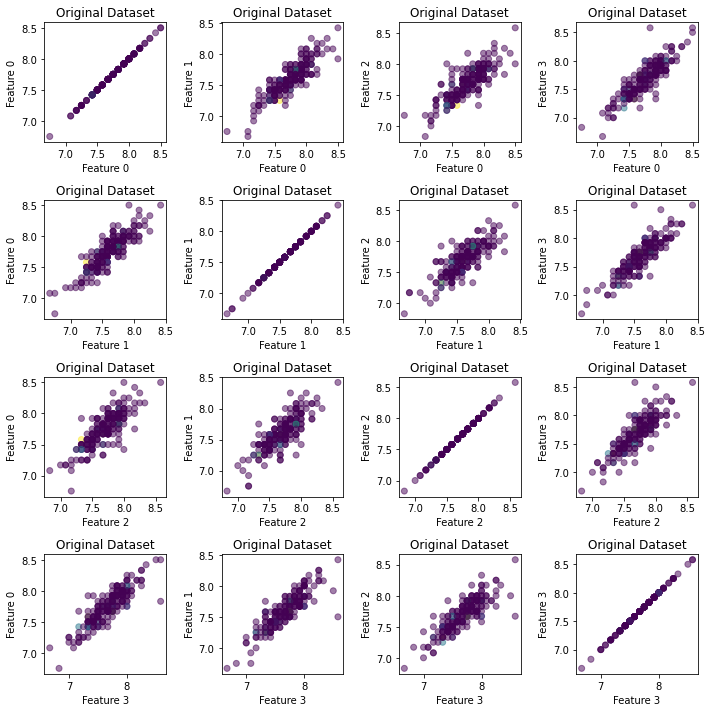

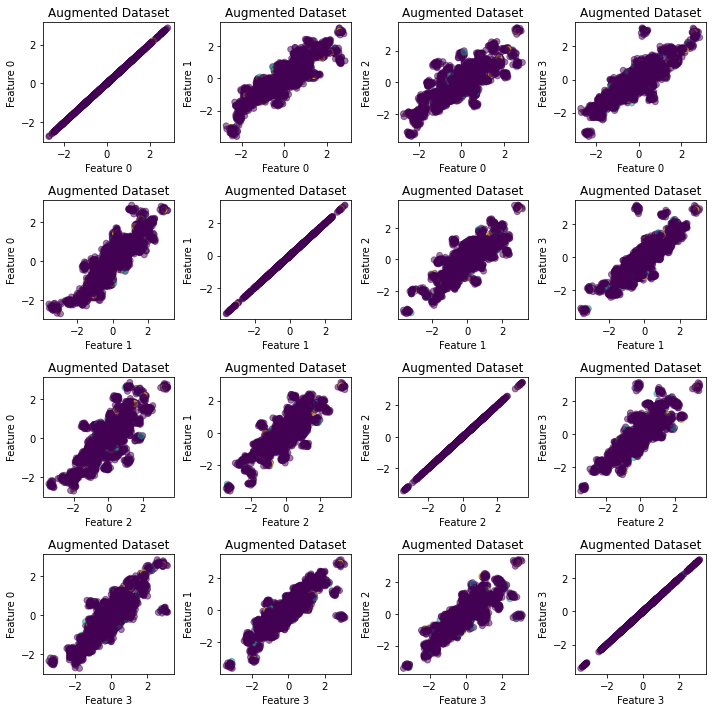

In [9]:
import matplotlib.pyplot as plt

# Create scatter plots for each pair of features (original dataset)
num_features = X.shape[1]  # Number of features in the dataset

fig, axs = plt.subplots(num_features, num_features, figsize=(10, 10))

for i in range(num_features):
    for j in range(num_features):
        axs[i, j].scatter(X.iloc[:, i], X.iloc[:, j], c=y, cmap='viridis', alpha=0.5)
        axs[i, j].set_xlabel('Feature {}'.format(i))
        axs[i, j].set_ylabel('Feature {}'.format(j))
        axs[i, j].set_title('Original Dataset')

plt.tight_layout()

# Create scatter plots for each pair of features (augmented dataset)
fig, axs = plt.subplots(num_features, num_features, figsize=(10, 10))

for i in range(num_features):
    for j in range(num_features):
        axs[i, j].scatter(augmented_X[:, i], augmented_X[:, j], c=augmented_y, cmap='viridis', alpha=0.5)
        axs[i, j].set_xlabel('Feature {}'.format(i))
        axs[i, j].set_ylabel('Feature {}'.format(j))
        axs[i, j].set_title('Augmented Dataset')

plt.tight_layout()
plt.show()

### 2.2 Image Data

Getting a good dataset is crucial for training accurate deep learning models, but finding enough high-quality images can be difficult. Image data augmentation solves this problem by adding more images to the training dataset.

Image data augmentation is a technique commonly used in deep learning for computer vision tasks. It involves creating new images by making small changes to existing ones, such as adjusting brightness or rotating the image. The goal is to expand the training dataset artificially, providing a wider range of data for model training. This helps improve the accuracy and reliability of deep learning models as they learn to recognize different variations in the training data.

Image data augmentation includes various techniques, from basic image manipulation to more advanced approaches using techniques like Generative Adversarial Networks (GANs). Basic techniques like rotating, translating, and adjusting brightness are commonly used for augmentation. By using these techniques, deep learning models for computer vision tasks can benefit from a larger and more diverse dataset, enabling the model to generalize better and reduce overfitting. resulting in improved performance and accuracy.

<div style="text-align:center">
    <p style="font-weight: bold; font-size:12px; text-align:center">Image Data Augmentation Techniques</p>
    <img src="images/04/image_data.jpg" width="400">
    <p style="font-style:italic; font-size:12px; text-align:center">Image Source: <a href="https://link.springer.com/article/10.1186/s40537-019-0197-0#citeas" style="text-decoration:none; color:inherit;">Shorten & Khoshgoftaar, 2019</a></p>
</div>

In this section, we will just focus on fundamental image augmentation techniques: geometric transformation, photometric transformation, and random erasing. The photometric transformation includes colorspace shifting, applying different image filters, and adding noise. Feel free to read the paper [Nour Eldeen Khalifa et al., 2021](https://link.springer.com/article/10.1007/s10462-021-10066-4) to get more information. 

<div style="text-align:center">
    <img src="images/04/image.webp" width="400"> 
    <p style="font-style:italic; font-size:12px; text-align:center">Image Source: <a href="https://towardsdatascience.com/smote-synthetic-data-augmentation-for-tabular-data-1ce28090debc" style="text-decoration:none; color:inherit;">Medium</a></p>
</div>

To implement basic image augmentation techniques, we can utilize the ImageDataGenerator class from Keras (also available in TensorFlow's high-level API, tensorflow.keras). This class allows us to generate batches of image data tensors with real-time data augmentation. Alternatively, we can use the transforms function from PyTorch to achieve similar results. 

Now, let's gain hands-on experience by applying these techniques.

**Tensorflow environment preparation**

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib.pyplot import imread, imshow, subplots, show

def plot_tf(data_generator):
    """
    Plots 4 images generated by an object of the ImageDataGenerator class.
    """
    data_generator.fit(images_tf)
    image_iterator = data_generator.flow(images_tf)
    
    # Plot the images given by the iterator
    fig, rows = subplots(nrows=1, ncols=4, figsize=(18,18))
    for row in rows:
        row.imshow(image_iterator.next()[0].astype('int'))
        row.axis('off')
    show()

2023-07-20 21:52:47.277716: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


First, let's get the image we'll be using. You can either upload your own image or use the one we downloaded from the [internet](https://royvon.co.uk/wp-content/uploads/2020/11/IsGettingADogRightForMe.jpg).

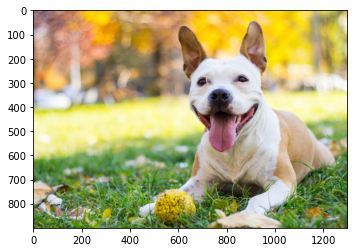

In [11]:
image_tf = imread("images/04/dog.jpg")

# Creating a dataset which contains just one image.
images_tf = image_tf.reshape((1, image_tf.shape[0], image_tf.shape[1], image_tf.shape[2]))

imshow(images_tf[0])
show()

**Pytorch environment preparation**

/apps/python/3.10/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /apps/python/3.10/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda20CUDACachingAllocator12recordStreamERKNS_7DataPtrENS0_10CUDAStreamE
  warn(f"Failed to load image Python extension: {e}")


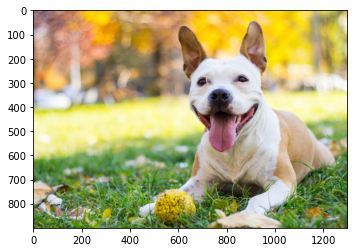

In [12]:
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")


def plot_torch(data_transform):
    """
    Plots 4 images generated by an object of the PyTorch transforms.Compose class.
    """
    transform = transforms.Compose(data_transform)
    transformed_images = [transform(images_torch.squeeze(0)).numpy().astype('int') for _ in range(4)]

    # Plot the transformed images
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 18))
    for ax, img in zip(axes, transformed_images):
        ax.imshow(img.transpose((1, 2, 0)))
        ax.axis('off')
    plt.show()


image_torch = plt.imread("images/04/dog.jpg")

# Creating a dataset which contains just one image.
images_torch = image_torch.transpose((2, 0, 1))
images_torch = torch.from_numpy(images_torch).unsqueeze(0)

plt.imshow(images_torch[0].numpy().transpose((1, 2, 0)).astype('int'))
plt.show()

#### 2.2.1 Geometric Transformation

Geometric transformation refers to the modification of an image's geometry by performing operations such as flipping along the X-axis or Y-axis, cropping, padding, rotating, warping, and translation. These basic techniques form the foundation for more complex augmentation methods. 

**(1) Flipping**

There are two types of flipping: horizontal flipping along the Y-axis and vertical flipping along the X-axis. When you turn photos along the Y-axis, they resemble a mirror reflection. As a result, this technique applies to most types of pictures, except for directional images like street signs.

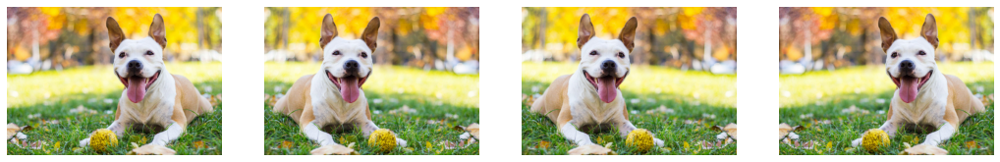

In [13]:
data_generator = ImageDataGenerator(horizontal_flip=True)
plot_tf(data_generator)

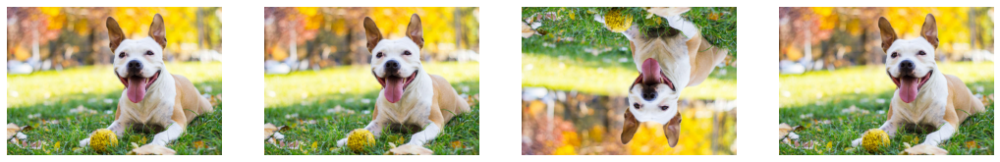

In [14]:
data_generator = ImageDataGenerator(vertical_flip=True)
plot_tf(data_generator)

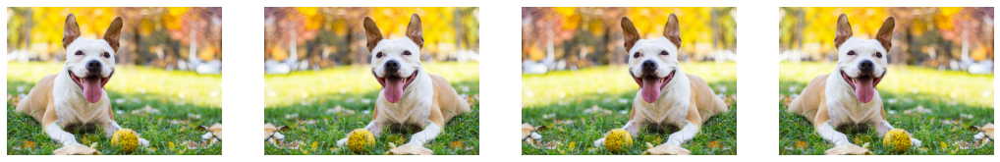

In [15]:
data_transform = [transforms.RandomHorizontalFlip(p=0.5)]
plot_torch(data_transform)

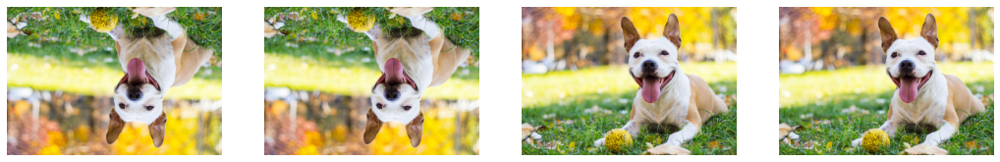

In [16]:
data_transform = [transforms.RandomVerticalFlip(p=0.5)]
plot_torch(data_transform)

**(2) Rotating**

Rotating an image entails rotating the picture either clockwise or counterclockwise. The rotation is measured in degrees and follows a clockwise direction. 

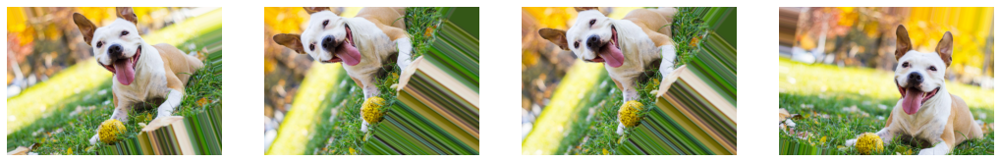

In [17]:
data_generator = ImageDataGenerator(rotation_range=90)
plot_tf(data_generator)

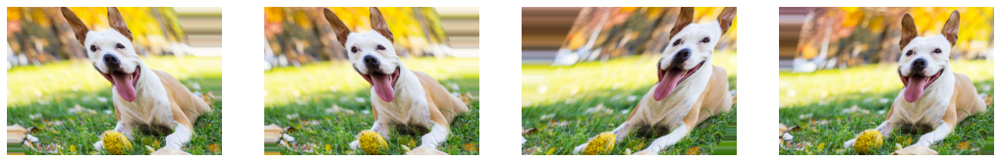

In [18]:
data_generator = ImageDataGenerator(shear_range=45.0)
plot_tf(data_generator)

Shear transformation slants the image shape by stretching it at a specified shear angle. This creates a unique "stretch" effect, different from rotation. The shear_range parameter controls the angle of the slant in degrees.

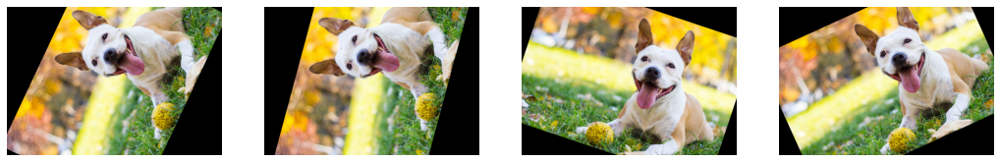

In [19]:
data_transform = [transforms.RandomRotation(90)]
plot_torch(data_transform)

**(3) Resizing**

Resizing an image can be performed while maintaining the same aspect ratio or without preserving it:

* Zooming is when you make the image bigger, crop it, and keep the proportions the same.
* Squishing is when you make the image bigger or smaller, but it changes the original proportions. 

The suitable level for zooming, squishing, or other resizing techniques depends on the type of image.

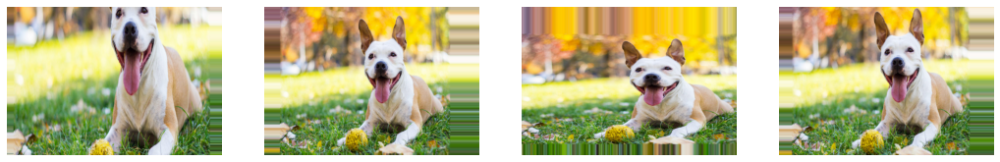

In [20]:
data_generator = ImageDataGenerator(zoom_range=[0.5, 1.5])
plot_tf(data_generator)

The `zoom_range` argument allows for random zooming of the image. A value less than 1.0 magnifies the image, while a value greater than 1.0 zooms out of the image.

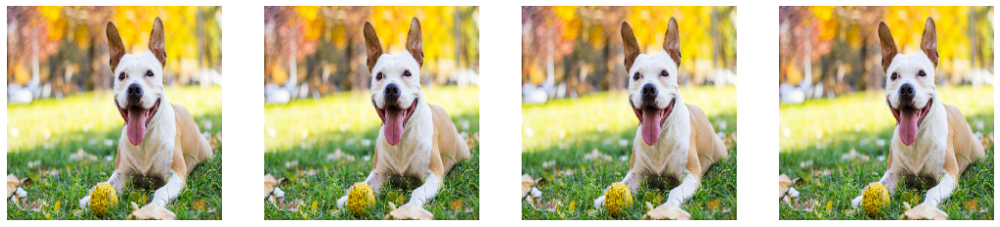

In [21]:
data_transform = [transforms.Resize((224, 224))]
plot_torch(data_transform)

**(4) Cropping**

When cropping an image, the edges of the picture are removed. Square images are commonly used as input in most convolutional neural networks (CNNs).

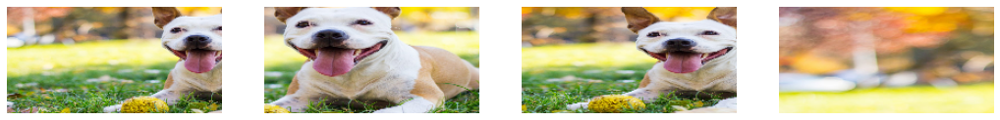

In [22]:
data_transform = [transforms.RandomResizedCrop((100, 200))]
plot_torch(data_transform)

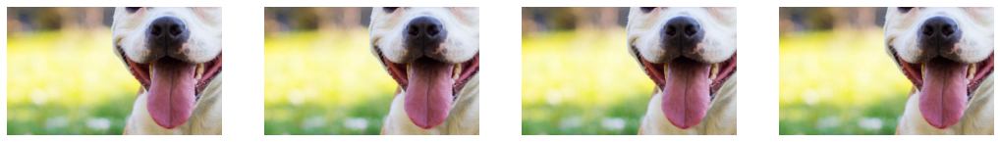

In [23]:
data_transform = [transforms.CenterCrop((300, 500))]
plot_torch(data_transform)

**(5) Padding**

Padding is the process of adding extra pixels to the outer edges of an image canvas. There are three commonly used methods for padding:

* Zero padding fills the image with black, white, gray, or Gaussian noise.
* Reflection padding mirrors the image's edges to create the padding area.
* Border padding repeats the border pixels of the image to extend into the padding section.

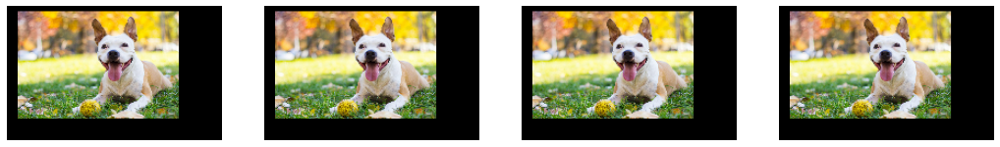

In [24]:
padding = (10, 5, 40, 20)
data_transform= [
    transforms.Resize((100,150)),
    transforms.Pad(padding, fill=0,padding_mode="constant"),
]
plot_torch(data_transform)

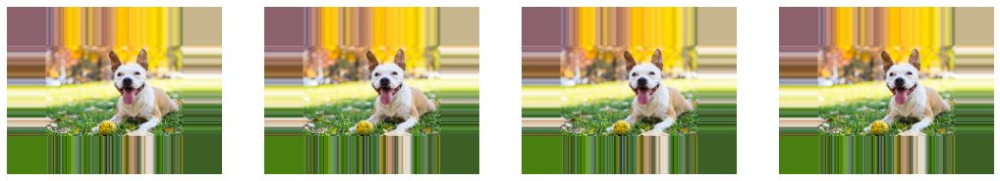

In [25]:
padding = (40, 40, 40, 40)
data_transform= [
    transforms.Resize((100,150)),
    transforms.Pad(padding, padding_mode="edge"),
]
plot_torch(data_transform)

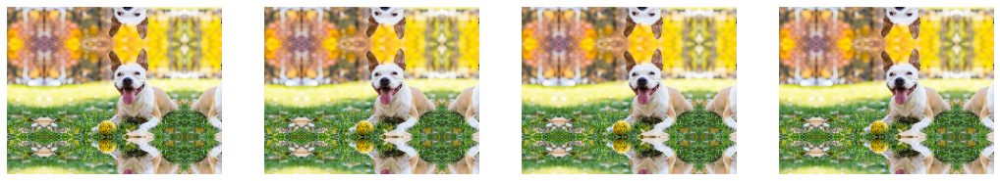

In [26]:
padding = (40, 40, 40, 40)
data_transform= [
    transforms.Resize((100,150)),
    transforms.Pad(padding, padding_mode="symmetric"),
]
plot_torch(data_transform)

**(6) Translation**

The translation method moves the image horizontally (Width Shifting) along the X-axis or vertically (Height Shifting) along the Y-axis.

* The `width_shift_range` is a floating point number ranging from 0.0 to 1.0 that determines the maximum fraction of the total width by which the image can be randomly shifted either to the left or right.

* Height Shifting works similarly to width shifting, but the image is shifted vertically instead of horizontally.

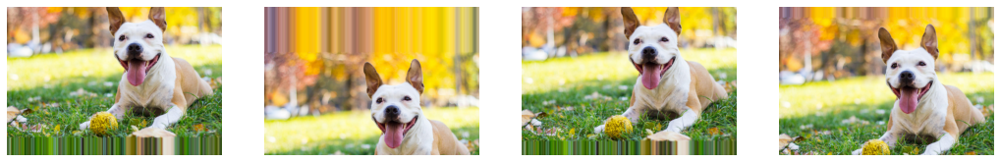

In [27]:
data_generator = ImageDataGenerator(width_shift_range=0.3)
plot_tf(data_generator)

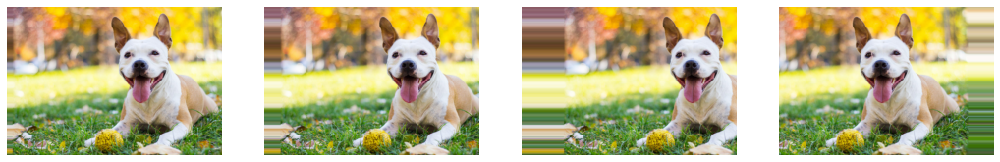

In [29]:
data_generator = ImageDataGenerator(height_shift_range=0.3)
plot_tf(data_generator)

Image Axis Order: (900, 1300, 3)


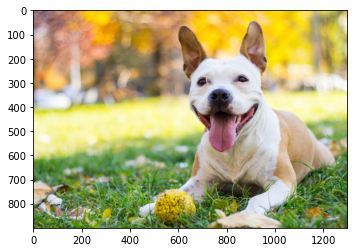

In [30]:
print("Image Axis Order:", images_tf[0].shape)
imshow(images_tf[0])
show()

<div style="padding: 10px;margin-bottom: 20px;border: thin solid #65BB7B;border-left-width: 10px;background-color: #fff"><strong>Note:</strong> The image has an axis order of (900, 1300, 3), where the x-axis represents the vertical dimension and the y-axis represents the horizontal dimension. Due to this axis order, when we perform a width shift, it appears as if the image shifts vertically, and when we perform a height shift, it appears as if the image shifts horizontally.</div>


When applying geometric transformations, it is important to control the magnitude of distortion based on the subject of the image. There is no universal formula that governs geometric transformation for all images, as each image may require different adjustments to achieve the desired result.

#### 2.2.2 Photometric Transformations

An image is represented as a three-dimensional array or a rank 3 tensor, where the first two dimensions correspond to the width and height coordinates of each pixel. The third dimension represents the RGB value of each pixel, ranging from 0 to 255 (or #00 to #FF in hexadecimal). In the printing world, the equivalent color model is CMYK (cyan, magenta, yellow, and key). Another commonly used format is HSV (hue, saturation, value). It's important to note that an image is essentially a matrix of integer or float values, particularly when it is normalized.

**(1) Colorspace shifting**

There are numerous filters available that can modify the color space of an image, ranging from common to more unique options. The fundamental methods include darkening, lightening, sharpening, blurring, adjusting contrast, and applying color casts. In addition to these basics, there is a vast array of filter categories, including retro, groovy, steampunk, and many more. 

Let us see some code examples.

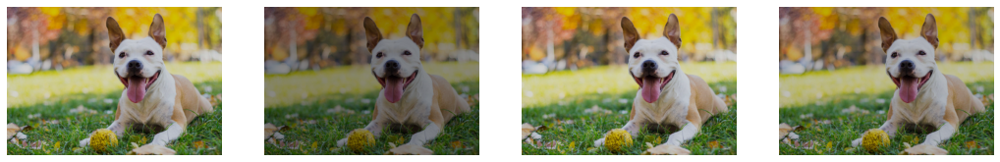

In [31]:
data_generator = ImageDataGenerator(brightness_range=(0.1, 0.9))
plot_tf(data_generator)

The "brightness_range" parameter determines the range from which a random brightness shift value is chosen. A brightness value of 0.0 represents no brightness, while a value of 1.0 represents maximum brightness.

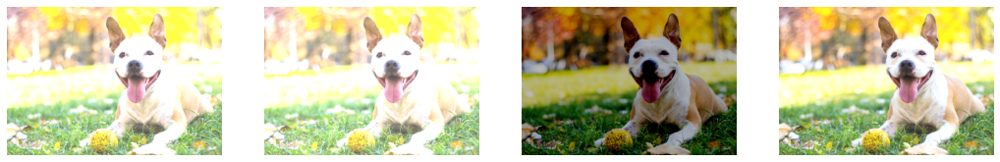

In [32]:
data_generator = ImageDataGenerator(channel_shift_range=150.0)
plot_tf(data_generator)

Channel shift randomly applies a shift to the channel values by selecting a random value within the range defined by "channel_shift_range".

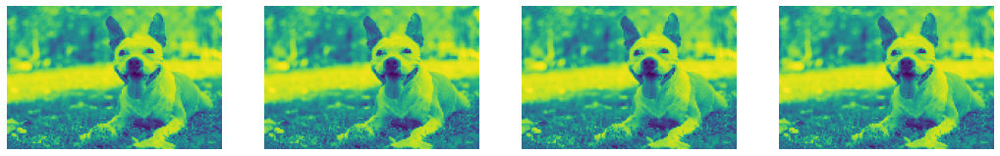

In [33]:
data_transform  = [transforms.Resize((100,150)),
    transforms.Grayscale(num_output_channels=1)]
plot_torch(data_transform)

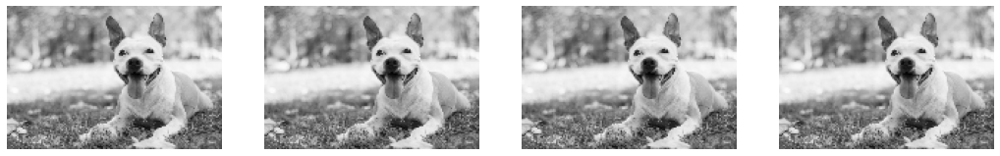

In [34]:
data_transform  = [transforms.Resize((100,150)),
    transforms.Grayscale(num_output_channels=3)]
plot_torch(data_transform)

The function `Grayscale` converts an image (PIL Image or torch tensor) into a grayscale.

Grayscale parameter settings: The parameter "num_output_channels" (int, either 1 or 3) to specifies the number of output channels in the resulting image.

* 1: The image will have a single channel (black and white).
* 3: The image will have three channels (RGB), where the values of red, green, and blue channels will be the same, resulting in grayscale.

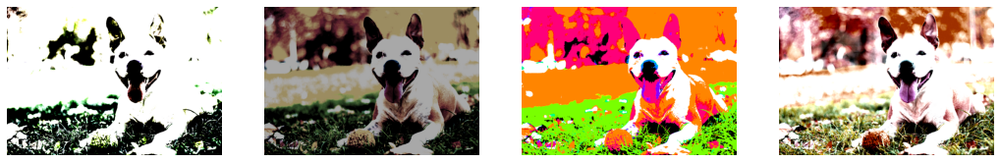

In [35]:
data_transform = [transforms.ColorJitter(brightness=(0, 5), contrast=(
        0, 5), saturation=(0, 5), hue=(-0.1, 0.1))]
plot_torch(data_transform)

`ColorJitter` can randomly adjust the brightness, contrast, saturation, and hue of an image.

* **brightness:** (float or tuple(min, max)) Adjusts the brightness by randomly selecting a value from [max(0, 1-brightness), 1+brightness] or [min, max]. Must be non-negative.
* **contrast:** (float or tuple(min, max)) Adjusts the contrast by randomly selecting a value from [max(0, 1-contrast), 1+contrast] or [min, max]. Must be non-negative.
* **saturation:** (float or tuple(min, max)) Adjusts the saturation by randomly selecting a value from [max(0, 1-saturation), 1+saturation] or [min, max]. Must be non-negative.
* **hue:** (float or tuple(min, max)) Adjusts the hue by randomly selecting a value from [-hue, hue] or [min, max]. However, hue must be set within the range [0, 0.5] or -0.5 <= min <= max <= 0.5.

**(2) Kernel filters**

These techniques are mostly used to sharpen or blur images using filters. They use an NxN kernel under the hood, which is similar to the inner working of Convolutional Neural Networks (CNN)

**What is a filter or kernel?**

In simple terms, filters or kernels are matrices used to apply image effects through a mathematical operation called convolution. Convolution involves adding each pixel of the image to its nearby pixels, using the weights specified in the kernel. The resulting pixel values in the image are calculated by multiplying the kernel values with the corresponding input image pixel values. This process is repeated until the kernel has covered the entire input image.

<div style="text-align:center">
    <img src="images/04/kernel.png" width="400"> 
    <p style="font-style:italic; font-size:12px; text-align:center">Image Source: <a href="https://medium.com/codex/kernels-filters-in-convolutional-neural-network-cnn-lets-talk-about-them-ee4e94f3319" style="text-decoration:none; color:inherit;">Medium</a></p>
</div>

Now, let's gain some hands-on experience. This exercise is inspired by the article [Image Effects using Convolutional Filters and Kernels](https://medium.com/swlh/image-processing-with-python-convolutional-filters-and-kernels-b9884d91a8fd), feel free to check it.

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from skimage.transform import rescale
from scipy.signal import convolve2d

First, let's upload the image we'll be using. The dog image was downloaded from the [internet](https://www.hepper.com/wp-content/uploads/2022/11/Apricot-toy-poodle-frantically-running-towards-the-camera-very-happy-playing-trained-on-green-grass-in-a-park_Linas-T_shutterstock.jpg).

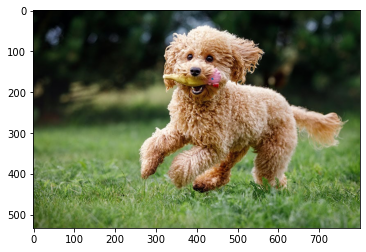

In [37]:
my_dog = imread('images/04/dog_2.jpg')
plt.imshow(my_dog, cmap='gray');

In order to make the effects of the filters and kernels more visible, we will resize the image to 10% of its original size.

In [38]:
r_scaled = rescale(my_dog[:,:,0], 0.10)
g_scaled = rescale(my_dog[:,:,1], 0.10)
b_scaled = rescale(my_dog[:,:,2], 0.10)
my_dog_scaled = np.stack([r_scaled, g_scaled, b_scaled], axis=2)
my_dog_gray = rescale(rgb2gray(my_dog), 0.10)

We will also create a function that applies the convolution operation to all channels of the image.

In [39]:
def rgb_convolve2d(image, kernel):
    red = convolve2d(image[:,:,0], kernel, 'valid')
    green = convolve2d(image[:,:,1], kernel, 'valid')
    blue = convolve2d(image[:,:,2], kernel, 'valid')
    return np.stack([red, green, blue], axis=2)

Next, we'll apply the *identity* filter to the image.

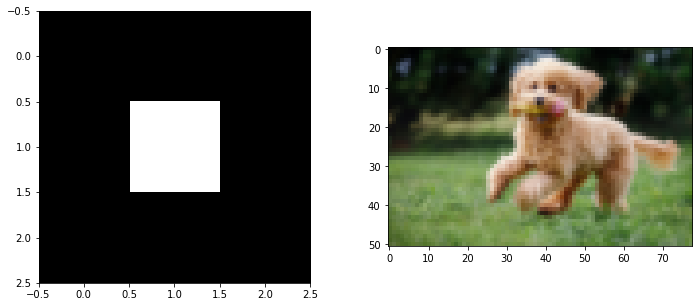

In [40]:
identity = np.array([[0, 0, 0],
                     [0, 1, 0],
                     [0, 0, 0]])
conv_im1 = rgb_convolve2d(my_dog_scaled, identity)
fig, ax = plt.subplots(1,2, figsize=(12,5))
ax[0].imshow(identity, cmap='gray')
ax[1].imshow(abs(conv_im1), cmap='gray');

Let's now apply edge detection filters to the grayscale image.

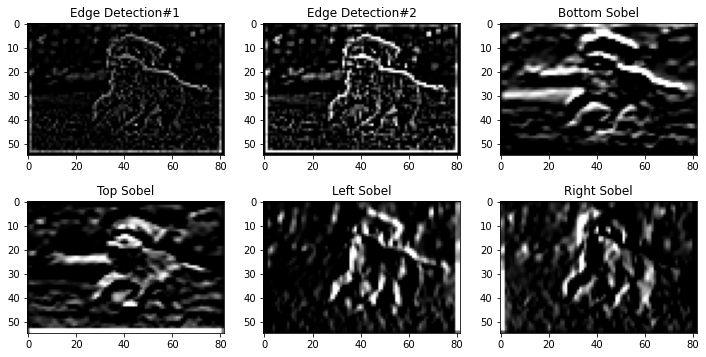

In [41]:
# Edge Detection1
kernel1 = np.array([[0, -1, 0],
                    [-1, 4, -1],
                    [0, -1, 0]])
# Edge Detection2
kernel2 = np.array([[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]])
# Bottom Sobel Filter
kernel3 = np.array([[-1, -2, -1],
                    [0, 0, 0],
                    [1, 2, 1]])
# Top Sobel Filter
kernel4 = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])
# Left Sobel Filter
kernel5 = np.array([[1, 0, -1],
                    [2, 0, -2],
                    [1, 0, -1]])
# Right Sobel Filter
kernel6 = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])
kernels = [kernel1, kernel2, kernel3, kernel4, kernel5, kernel6]
kernel_name = ['Edge Detection#1', 'Edge Detection#2', 
               'Bottom Sobel', 'Top Sobel', 
               'Left Sobel', 'Right Sobel']
figure, axis = plt.subplots(2,3, figsize=(12,6))
for kernel, name, ax in zip(kernels, kernel_name, axis.flatten()):
     conv_im1 = convolve2d(my_dog_gray, 
                           kernel[::-1, ::-1]).clip(0,1)
     ax.imshow(abs(conv_im1), cmap='gray')
     ax.set_title(name)

The edge detection process identifies regions with sharp changes in intensity or color. High values signify sharp changes, while low values indicate gradual transitions. The Sobel operators also emphasize edges but in specific directions. For instance, the bottom Sobel highlights edges in the lower part of the object.

Now, let's try different types of kernel operators on the original image.

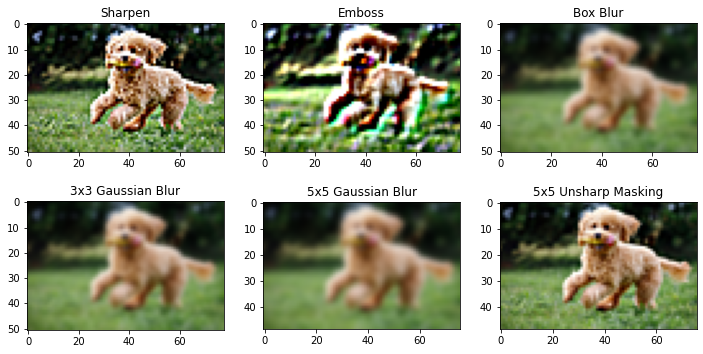

In [42]:
# Sharpen
kernel7 = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])
# Emboss
kernel8 =  np.array([[-2, -1, 0],
                     [-1,  1, 1],
                     [ 0,  1, 2]])
# Box Blur
kernel9 = (1 / 9.0) * np.array([[1, 1, 1],
                                [1, 1, 1],
                                [1, 1, 1]])
# Gaussian Blur 3x3
kernel10 = (1 / 16.0) * np.array([[1, 2, 1],
                                  [2, 4, 2],
                                  [1, 2, 1]])
# Gaussian Blur 5x5
kernel11 = (1 / 256.0) * np.array([[1, 4, 6, 4, 1],
                                   [4, 16, 24, 16, 4],
                                   [6, 24, 36, 24, 6],
                                   [4, 16, 24, 16, 4],
                                   [1, 4, 6, 4, 1]])
# Unsharp masking 5x5
kernel12 = -(1 / 256.0) * np.array([[1, 4, 6, 4, 1],
                                   [4, 16, 24, 16, 4],
                                   [6, 24, -476, 24, 6],
                                   [4, 16, 24, 16, 4],
                                   [1, 4, 6, 4, 1]])
kernels = [kernel7, kernel8, kernel9, kernel10, kernel11, kernel12]
kernel_name = ['Sharpen', 'Emboss', 'Box Blur', 
               '3x3 Gaussian Blur', '5x5 Gaussian Blur', 
               '5x5 Unsharp Masking']
figure, axis = plt.subplots(2,3, figsize=(12,6))
for kernel, name, ax in zip(kernels, kernel_name, axis.flatten()):
     conv_im1 = rgb_convolve2d(my_dog_scaled, 
                               kernel[::-1, ::-1]).clip(0,1)
     ax.imshow(abs(conv_im1), cmap='gray')
     ax.set_title(name)

**(3) Noise injection**

Noise injection involves adding random black, white, or colored pixels to an image, resulting in a grainy effect on the original image. Gaussian noise is commonly used to generate natural-looking noise in photos and is based on the Gaussian distribution algorithm developed by mathematician Carl Friedrich Gauss in the 1830s.

To inject noise into an image using TensorFlow, you can utilize the `tf.random.normal` function to generate random noise with the desired properties, and then add it to the image.

Here's an example code snippet showcasing how to inject Gaussian noise into an image using TensorFlow:

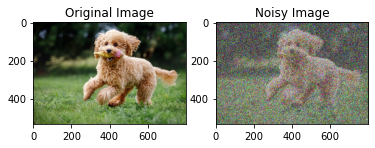

In [43]:
import tensorflow as tf

# Load the image
image = tf.image.decode_png(tf.io.read_file('images/04/dog_2.jpg'), channels=3)
image = tf.cast(image, dtype=tf.float32) / 255.0  # Normalize the image

# Define the noise properties
mean = 0.0
stddev = 1.0
noise = tf.random.normal(shape=tf.shape(image), mean=mean, stddev=stddev)

# Add the noise to the image
noisy_image = tf.clip_by_value(image + noise, 0.0, 1.0)

# Display the original and noisy images
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image")

plt.show()

To inject noise into an image using PyTorch, you can utilize the `torch.randn` function to generate random noise with the desired properties and then add it to the image.

Here's an example code snippet showcasing how to inject Gaussian noise into an image using PyTorch:

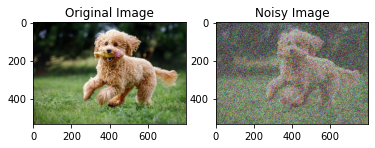

In [44]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load the image and convert it to a PyTorch tensor
image = transforms.ToTensor()(Image.open('images/04/dog_2.jpg'))

# Define the noise properties
mean = 0.0
stddev = 1.0
noise = torch.randn(image.size()) * stddev + mean

# Add the noise to the image
noisy_image = torch.clamp(image + noise, 0.0, 1.0)

# Convert the noisy image back to a NumPy array
noisy_image = (noisy_image * 255).byte().numpy().transpose(1, 2, 0)

# Display the original and noisy images
plt.subplot(1, 2, 1)
plt.imshow(image.permute(1, 2, 0))
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image")

plt.show()

#### 2.2.3 Random Erasing

Random erasing is a technique that randomly selects a rectangular region within an image and replaces or overlays it with pixels of a certain color (such as gray, black, or white) or adds Gaussian noise. While it may seem counterintuitive, this technique has been found to enhance the forecasting accuracy of AI models.

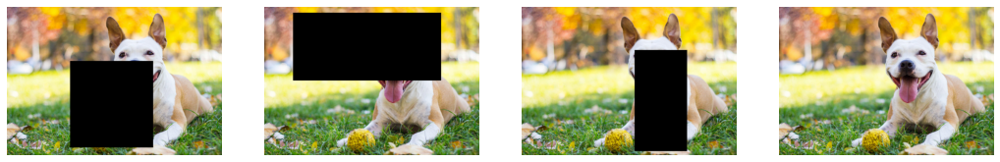

In [47]:
data_transform = [transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=0, inplace=False)]
plot_torch(data_transform)

To learn more about Random Erasing, you can refer to the paper titled "Random Erasing Data Augmentation" authored by [Zhong et al. 2017](https://arxiv.org/abs/1708.04896). This paper provides detailed information and insights into the Random Erasing technique. 

There are also many more image augmentation techniques that we have not covered in this section but we encourage you to check them out in the official documentation from [Tensorflow](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) and [Pytorch](https://pytorch.org/vision/main/transforms.html).

#### 2.2.4 Data Augmentation on Classes of Images
We have learned the basics of image data augmentation and how it can be applied to a single image. In deep learning, we commonly work with datasets containing multiple images. If you are interested in learning more about image dataset augmentation, we invite you to explore our [Convolutional Neural Networks](https://practicumai.org/courses/cnn/) workshop.

### 2.3 Text Data

Text augmentation is a technique used in Natural Language Processing (NLP) to generate more data by modifying or creating new text from existing data. It involves methods like swapping characters, injecting noise, replacing synonyms, deleting and inserting words, and swapping words. The goal, like image augmentation, is to expand the training dataset and improve AI prediction accuracy.

However, evaluating text augmentation is trickier than image augmentation. Image techniques, such as flipping a photo, are clear, but character swapping might confuse readers, leading to subjective benefits. The effectiveness of text augmentation depends on the data quality and the specific NLP task. Determining the right level of augmentation for a dataset is challenging and requires experimentation to get the desired results. 

In this section, we'll explore how to enhance text data in NLP by using common techniques to enrich its quality and diversity.

<div style="text-align:center">
    <p style="font-weight: bold; font-size:12px; text-align:center">Text Data Augmentation Techniques</p>
    <img src="images/04/text.jpg" width="400">
</div>

#### 2.3.1 Text Substitution

Text substitution is a data augmentation technique used in Natural Language Processing (NLP) to replace words with their equivalent synonyms without altering the meaning of the text. There are two main approaches to text substitution: Rule-Based Substitution and ML-Based Substitution.

* Rule-Based Substitution:
  - In Rule-Based Substitution, words are replaced with their synonyms from a hand-crafted system, such as WordNet. This method is lightweight and easy to implement, offering increased diversity in data with minimal effort. However, it lacks context awareness and may not be ideal for all datasets.

* ML-Based Substitution:
  - ML-Based Substitution leverages Machine Learning models to intelligently replace words while considering the context. Word Embedding models like Word2Vec, GloVe, and FastText create multidimensional vector representations of words, enabling efficient comparison and substitution with their nearest neighbors in the vector space. 
  - Alternatively, models like BERT utilize mask-based substitution, leveraging pre-trained contextual information to predict word replacements.
  
Below are some code examples for Rule-Based Substitution and ML-Based Substitution using Word Embedding models.

Rule-Based Substitution (using NLTK and WordNet):

In [48]:
from nltk.corpus import wordnet
import random

def rule_based_substitution(sentence):
    words = sentence.split()
    new_sentence = []
    for word in words:
        # Check if the word has synonyms in WordNet
        synsets = wordnet.synsets(word)
        if synsets:
            synonyms = synsets[0].lemmas()
            # Exclude the original word from the list of synonyms
            synonyms = [synonym.name().replace('_', ' ') for synonym in synonyms if synonym.name() != word]
            # If synonyms are available, randomly choose one and replace the word
            if synonyms:
                new_word = random.choice(synonyms)
                new_sentence.append(new_word)
                continue
        # If no synonyms are found or word is not in WordNet, keep the original word
        new_sentence.append(word)
    
    return ' '.join(new_sentence)

# Example usage
original_sentence = "Python is incredible. I adore Python; it's the top language for me.\
Among all languages, Python is the easiest to read."
new_sentence = rule_based_substitution(original_sentence)
print("Original Sentence:", original_sentence)
print("New Sentence:", new_sentence)

Original Sentence: Python is incredible. I adore Python; it's the top language for me.Among all languages, Python is the easiest to read.
New Sentence: python be incredible. iodine adore Python; it's the top linguistic communication for me.Among all languages, python be the easy to read.


ML-Based Substitution (using KeyedVectors model):

In [49]:
import os
import gensim.downloader as api

# Specify the name of the pre-trained model you want to download
model_name = 'glove-twitter-25'

# Get the current working directory
output_folder = os.getcwd()

# Download the model using Gensim
model = api.load(model_name)

# Save the model to the current working directory with the desired file name and extension
model.save(model_name + '.model')

In [50]:
from gensim.models import KeyedVectors
import random

# Specify the full path to the saved model file (including the filename and extension)
model_file_path = 'glove-twitter-25.model'

# Load the pre-trained KeyedVectors model
model = KeyedVectors.load(model_file_path)

def ml_based_substitution(sentence):
    words = sentence.split()
    new_sentence = []
    for word in words:
        # Check if the word exists in the KeyedVectors model
        if word in model:
            # Find the most similar word (nearest neighbor) to the original word
            similar_words = model.most_similar(positive=[word], topn=5)
            # Randomly choose a similar word as the substitution
            if similar_words:
                new_word = random.choice(similar_words)[0]
                new_sentence.append(new_word)
                continue
        # If the word is not in the KeyedVectors model or no similar words found, keep the original word
        new_sentence.append(word)
    
    return ' '.join(new_sentence)

# Example usage
original_sentence = "Python is incredible. I adore Python; it's the top language for me.\
Among all languages, Python is the easiest to read."
new_sentence = ml_based_substitution(original_sentence)
print("Original Sentence:", original_sentence)
print("New Sentence:", new_sentence)

Original Sentence: Python is incredible. I adore Python; it's the top language for me.Among all languages, Python is the easiest to read.
New Sentence: Python that incredible. I admire Python; it's of big common from me.Among only languages, Python had this quickest take read.


<div style="padding: 10px;margin-bottom: 20px;border: thin solid #65BB7B;border-left-width: 10px;background-color: #fff"><strong>Note:</strong> The <em>glove-twitter-25</em> model from Gensim is trained on Twitter data and offers word embeddings with 25 dimensions, making it a more lightweight choice than bigger models. If desired, you can also choose a bigger model, such as the <em>word2vec-google-news-300</em> model with <mark style="background-color: lightgray;">Word2Vec.load()</mark> function.</div>


#### 2.3.2 Back Translation

Back translation is a technique that utilizes automatic translation to diversify a dataset. It involves three main steps:

* Temporary translation: Each original labeled data point is translated into a different language, such as from English to French.
* Back translation: The translated data is then converted back to the original language, i.e., from French to English.
* Duplicate removal: After this process, for each original text data, its corresponding back-translation is obtained. To ensure uniqueness, duplicate occurrences are removed from the final dataset.

The objective of back translation is to introduce variations in the dataset, leading to sentences with similar meanings but different phrasings. This technique enhances the dataset's diversity and can be particularly useful for improving the performance of natural language processing models.

Now, let's explore how to implement back translation. This exercise is inspired by the article [Data Augmentation in NLP Using Back Translation](https://medium.com/towards-data-science/data-augmentation-in-nlp-using-back-translation-with-marianmt-a8939dfea50a), feel free to check it.

In [43]:
#!pip install sentencepiece

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1.2 -> 23.2
[notice] To update, run: pip install --upgrade pip


<div style="padding: 10px;margin-bottom: 20px;border: thin solid #65BB7B;border-left-width: 10px;background-color: #fff"><strong>Note:</strong> Once you have installed the sentencepiece library, be sure to restart your notebook to ensure that all the changes are applied and recognized.</div>

In [51]:
from transformers import MarianMTModel, MarianTokenizer

MariamMT is a powerful Machine Translation framework that utilizes the MarianNMT engine. This engine is developed by Microsoft and various academic institutions like the University of Edinburgh and Adam Mickiewicz University in Poznań, written entirely in C++. 

To start, let's first prepare two candidate models.

All model names from Hugging Face use the following format "Helsinki-NLP/opus-mt-{src}-{tgt}", where {src} and {tgt} correspond respectively to the source and target languages. Their value is a two-digit code representing the language. You can find the list of [language codes](https://developers.google.com/admin-sdk/directory/v1/languages). 

For our case, we will have two candidate models.
* The first model, "Helsinki-NLP/opus-mt-en-fr," translates from English to French.
* The second model, "Helsinki-NLP/opus-mt-en-fr," translates from French to English.

The configuration of each model requires two main classes: MarianTokenizer, used to load the right tokenizer, and MarianMTModel, used to load the pre-trained model.

In [52]:
# Get the name of the first model
source_lang = 'en'
target_lang = 'fr'
first_model_name = f'Helsinki-NLP/opus-mt-{source_lang}-{target_lang}'

# Get the tokenizer
first_model_tkn = MarianTokenizer.from_pretrained(first_model_name)

# Load the pretrained model based on the name
first_model = MarianMTModel.from_pretrained(first_model_name)

In [53]:
# Get the name of the second model
source_lang = 'fr'
target_lang = 'en'
second_model_name = f'Helsinki-NLP/opus-mt-{source_lang}-{target_lang}'


# Get the tokenizer
second_model_tkn = MarianTokenizer.from_pretrained(second_model_name)

# Load the pretrained model based on the name
second_model = MarianMTModel.from_pretrained(second_model_name)

Here is the list of text that will be used for translation.

In [54]:
original_texts = [
    "Data augmentation is a technique used to reduce overfitting in machine learning",
    "It involves creating additional slightly modified versions of the existing data",
    "In Natural Language Processing (NLP), one method of data augmentation is called Back Translation",
    "It works in the following way",
    "Take an input text in a source language (e.g., English)",
    "Translate this text to a temporary destination language (e.g., English -> French)",
    "Translate the previously translated text back into the source language (e.g., French -> English)",
]

original_texts

['Data augmentation is a technique used to reduce overfitting in machine learning',
 'It involves creating additional slightly modified versions of the existing data',
 'In Natural Language Processing (NLP), one method of data augmentation is called Back Translation',
 'It works in the following way',
 'Take an input text in a source language (e.g., English)',
 'Translate this text to a temporary destination language (e.g., English -> French)',
 'Translate the previously translated text back into the source language (e.g., French -> English)']

In order to implement the translation feature correctly, we must prepend the special token ">>{tgt}<<" to each text that requires translation. Please note that {tgt} can either be "fr" or "en". 

In [55]:
def format_batch_texts(language_code, batch_texts):
  
  formated_bach = [">>{}<< {}".format(language_code, text) for text in batch_texts]

  return formated_bach

In [56]:
# Test of the function
formated_batch = format_batch_texts("fr", original_texts)
print(formated_batch)

['>>fr<< Data augmentation is a technique used to reduce overfitting in machine learning', '>>fr<< It involves creating additional slightly modified versions of the existing data', '>>fr<< In Natural Language Processing (NLP), one method of data augmentation is called Back Translation', '>>fr<< It works in the following way', '>>fr<< Take an input text in a source language (e.g., English)', '>>fr<< Translate this text to a temporary destination language (e.g., English -> French)', '>>fr<< Translate the previously translated text back into the source language (e.g., French -> English)']


Now, let's translate the text from English to French. We will create a function for translating a batch of texts. This function will take three parameters: the batch of texts to be translated, the target language model, and the language code.

In [57]:
def perform_translation(batch_texts, model, tokenizer, language="fr"):
    # Prepare the text data into appropriate format for the model
    formated_batch_texts = format_batch_texts(language, batch_texts)
    
    # Generate translation using model
    translated = model.generate(**tokenizer(formated_batch_texts, return_tensors="pt", padding=True))

    # Convert the generated tokens indices back into text
    translated_texts = [tokenizer.decode(t, skip_special_tokens=True) for t in translated]
    
    return translated_texts

# Check the model translation from the original language (English) to French
translated_texts = perform_translation(original_texts, first_model, first_model_tkn)
print(translated_texts)

["L'augmentation des données est une technique utilisée pour réduire le surajustement dans l'apprentissage automatique", "Il s'agit de créer des versions légèrement modifiées supplémentaires des données existantes.", "Dans le traitement du langage naturel (NLP), une méthode d'augmentation des données s'appelle Back Translation", 'Il fonctionne de la manière suivante', "Prenez un texte d'entrée dans une langue source (p. ex., l'anglais)", 'Traduire ce texte dans une langue de destination temporaire (p. ex., anglais -> français)', 'Retransmettre le texte déjà traduit dans la langue source (p. ex., français -> anglais)']


Next, we will translate the previous result (in French) back to English.

In [58]:
# Perform the translation back to English
back_translated_texts = perform_translation(translated_texts, second_model, second_model_tkn)
print(back_translated_texts)

['• Increasing data is a technique used to reduce overadjustment in machine learning', 'The aim is to create slightly modified additional versions of existing data.', 'In natural language processing (NLP), a method of increasing data is called Back Translation.', 'It works as follows:', 'Have input text in a source language (e.g., English)', 'Translate this text into a temporary language of destination (e.g., English -> French)', 'Retransmit text already translated into the source language (e.g., French -> English)']


Create a function that combines the original texts and their back translations while removing any duplicates.

In [59]:
def combine_texts(original_texts, back_translated_batch):
  
  return set(original_texts + back_translated_batch) 

Finally, we'll merge all the previous helper functions into a single function that gives us the augmented texts. This function will provide both the original texts and their respective back translations as the output.

In [60]:
def perform_back_translation_with_augmentation(batch_texts, original_language="en", temporary_language="fr"):

  # Translate from Original to Temporary Language
  tmp_translated_batch = perform_translation(batch_texts, first_model, first_model_tkn, temporary_language)

  # Translate Back to English
  back_translated_batch = perform_translation(tmp_translated_batch, second_model, second_model_tkn, original_language)

  # Return The Final Result
  return combine_texts(original_texts, back_translated_batch)

# Execute the function for Data Augmentation
final_augmented = perform_back_translation_with_augmentation(original_texts)
print(final_augmented)

{'It involves creating additional slightly modified versions of the existing data', 'Retransmit text already translated into the source language (e.g., French -> English)', 'In natural language processing (NLP), a method of increasing data is called Back Translation.', 'It works in the following way', 'Translate the previously translated text back into the source language (e.g., French -> English)', 'Translate this text into a temporary language of destination (e.g., English -> French)', '• Increasing data is a technique used to reduce overadjustment in machine learning', 'Take an input text in a source language (e.g., English)', 'The aim is to create slightly modified additional versions of existing data.', 'Have input text in a source language (e.g., English)', 'Translate this text to a temporary destination language (e.g., English -> French)', 'Data augmentation is a technique used to reduce overfitting in machine learning', 'It works as follows:', 'In Natural Language Processing (N

#### 2.3.3 Text Generation

Generative or language modeling systems possess a remarkable capability to generate text with minimal input. We can leverage these text generation ML models for data augmentation.

There are various approaches to address this issue. For instance, one approach involves fine-tuning a pre-trained GPT model to produce text. Another option is to train a Generative Adversarial Network (GAN) to artificially create sentences resembling those in our dataset.

Although these techniques show great promise and could significantly enhance data augmentation for NLP, their implementation is not easy. It involves using complex neural networks with billions of parameters, which require a lot of computational power and manual fine-tuning of various settings. Moreover, there is considerable uncertainty about how the generated sentences will turn out.

### 2.4 Audio Data

Audio data augmentation, like image and text augmentation, expands datasets to enhance AI prediction accuracy. It offers a cost-effective solution when obtaining more audio files is challenging or time-consuming.

Describing audio augmentation faces unique challenges since audio isn't visual like images or text. When dealing with audiobooks, web pages, or mobile apps, we can play the sound, but on paper, the medium changes. Hence, we need to convert the audio signal into a visual representation. The Waveform graph, also known as the time series graph, is a common method used to represent audio signals. 

<div style="text-align:center">
    <p style="font-weight: bold; font-size:12px; text-align:center">Audio Data Augmentation</p>
    <img src="images/04/aduio.webp" width="400">
    <p style="font-style:italic; font-size:12px; text-align:center">Image Source: <a href="https://blog.pangeanic.com/audio-data-augmentation-techniques-and-methods" style="text-decoration:none; color:inherit;">pangeanic</a></p>
</div>

In this section, we will explore popular audio data augmentation techniques for both waveform (time domain) and spectrogram (frequency domain) data. Some techniques include noise injection, time shifting, changing speed, pitch, volume,  time warping and frequency/time masking for spectrograms.

To perform data augmentations on audio, we will utilize the `librosa` library, which is widely used for audio processing tasks. If you prefer working with PyTorch, an alternative option for audio processing is the `torchaudio` library. It provides similar functionality and can be seamlessly integrated into PyTorch workflows.

#### 2.4.1 Waveform (Time Domain)

The Waveform graph, also known as the time series graph, is a standard way of showing how the amplitude of an audio signal changes over time. It visually displays the variations in the signal's volume or pressure as it progresses, providing a simple representation of the audio's shape and characteristics. This graph is widely used in audio processing and analysis to visually understand the patterns and properties of the audio signal.

In [62]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

# Define a function to plot the waveform
def plot_waveform(audio, title):
    plt.figure(figsize=(14, 5))
    plt.plot(audio)
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

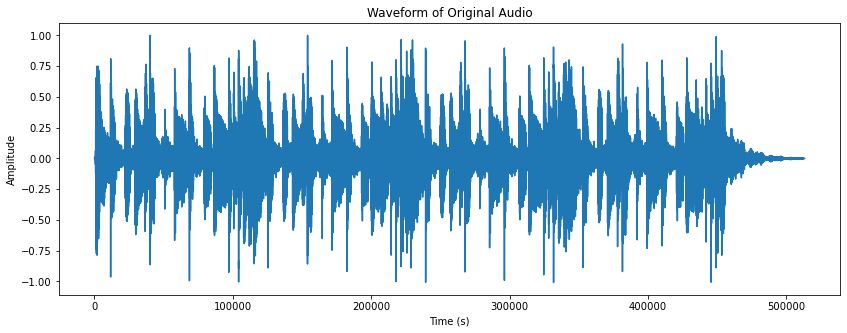

In [63]:
# Load the original audio
PATH = "data/smooth-ac-guitar-loop-93bpm-137706.mp3" 
original_audio, sample_rate = librosa.load(PATH)

# Plot the audio waveform
plot_waveform(original_audio, "Waveform of Original Audio")

The frequency also referred to as the sampling rate, indicates how many times the amplitude value was recorded in one second. The unit for sound frequency or sampling rate is hertz (Hz).

In [64]:
# Play the audio
from IPython.display import Audio

Audio(data=original_audio, rate=sample_rate)

<div style="padding: 10px; margin-bottom: 20px; border: thin solid #65BB7B; border-left-width: 10px; background-color: #fff;"><strong>Note:</strong> You can download free audio files from the <a href="https://pixabay.com/sound-effects/search/wav/">pixaby</a> website.</div>

**(1) Noise injection**

One common data augmentation technique involves introducing various types of noise into the original audio data. You have the flexibility to select from a wide range of noise types.

White noise

In [66]:
noise_factor = 0.005
white_noise = np.random.randn(len(original_audio)) * noise_factor

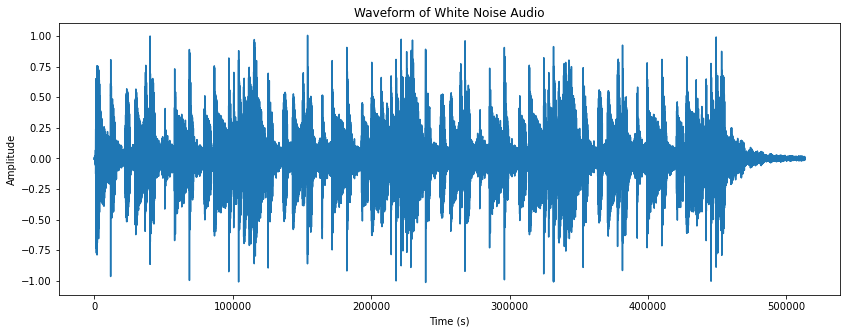

In [67]:
noisy_audio = original_audio + white_noise

plot_waveform(noisy_audio, "Waveform of White Noise Audio")

In [68]:
Audio(data=noisy_audio, rate=sample_rate)

Background noise

In [69]:
# Load the background noise and its sample rate
background_noise, noise_sample_rate = librosa.load("data/alarm-clock-1-29480.mp3")

# Resample the background noise to match the sample rate of the original audio
background_noise = librosa.resample(background_noise, noise_sample_rate, sample_rate)

# Trim or repeat the background noise to match the length of the audio signal
if len(background_noise) > len(original_audio):
    background_noise = background_noise[:len(original_audio)]
else:
    num_repeats = len(original_audio) // len(background_noise)
    background_noise = np.tile(background_noise, num_repeats + 1)[:len(original_audio)]

# Set the desired noise level (adjust as needed)
noise_level = 0.1

# Scale the background noise signal to the desired noise level
background_noise *= noise_level * np.max(np.abs(original_audio))

# Add the background noise to the original audio signal
backgroud_audio = original_audio + background_noise

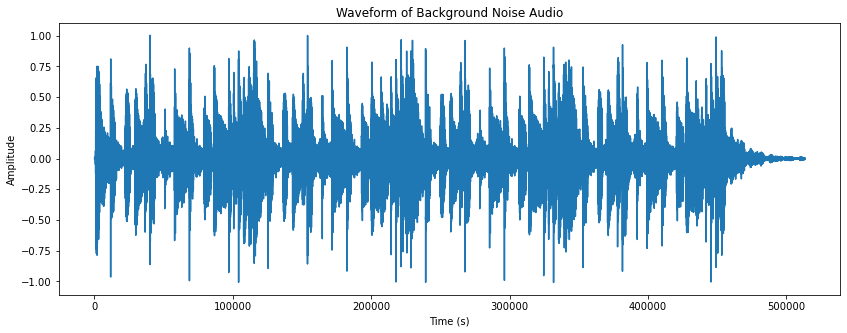

In [70]:
plot_waveform(backgroud_audio, "Waveform of Background Noise Audio")

In [71]:
Audio(data=backgroud_audio, rate=sample_rate)

**(2) Shifting time**

With the `roll()` function from the numpy library, you can shift the audio in time.

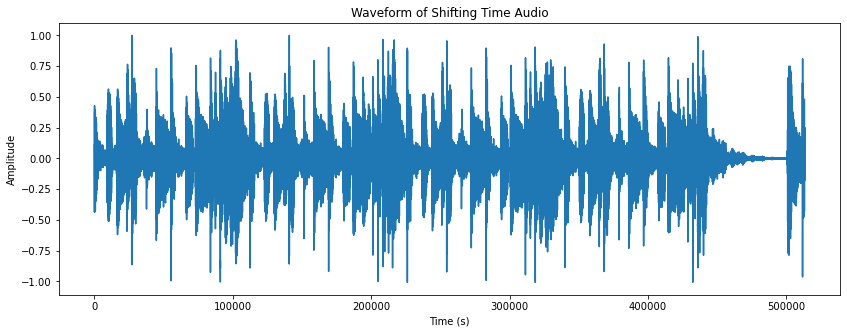

In [72]:
augmented_audio = np.roll(original_audio, 500000)

plot_waveform(augmented_audio, "Waveform of Shifting Time Audio")

In [73]:
Audio(data=augmented_audio, rate=sample_rate)

**(3) Changing speed**

You can also increase (rate>1) or decrease (rate<1) the speed of the audio with the `time_stretch()` method from the librosa library.

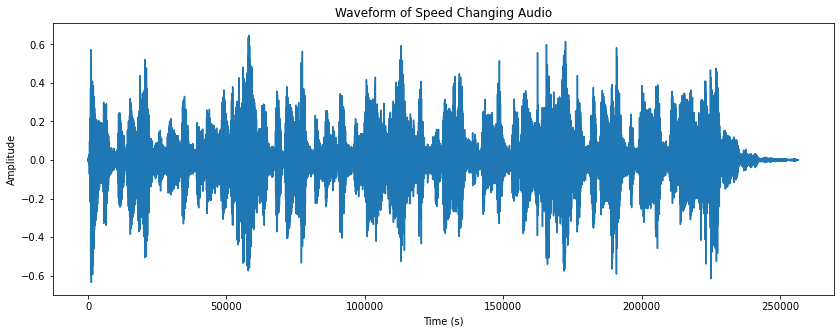

In [74]:
rate = 2
augmented_audio = librosa.effects.time_stretch(original_audio, rate = rate)

plot_waveform(augmented_audio, "Waveform of Speed Changing Audio")

In [75]:
Audio(data=augmented_audio, rate=sample_rate)

**(4) Changing pitch**

You can modify the pitch of the audio with the `pitch_shift()` method from the librosa library.

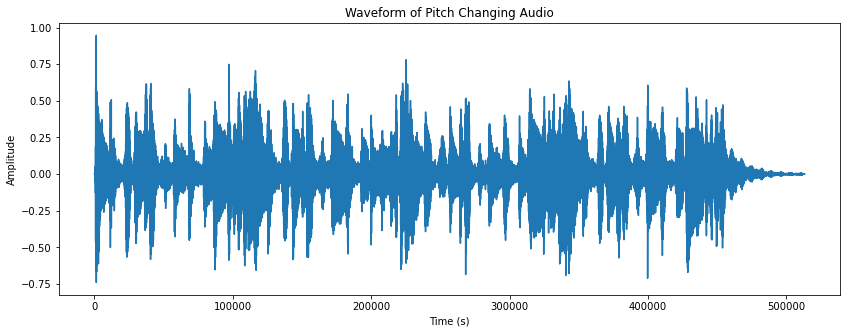

In [76]:
pitch_factor = 2.0  # A positive value increases pitch, a negative value decreases it.
augmented_audio = librosa.effects.pitch_shift(original_audio, sample_rate, pitch_factor)

plot_waveform(augmented_audio, "Waveform of Pitch Changing Audio")

In [77]:
Audio(data=augmented_audio, rate=sample_rate)

**(5) Changing volume**

Volume augmentation is another technique you can use to augment the audio waveform. However, it's important to note that if you plan to convert the waveform into spectrograms later on, volume augmentation may not be very effective. This is because in the frequency domain (used to create spectrograms), the amplitude of the waveform is not directly considered. So, while volume augmentation can change the overall loudness of the audio, it may not have a significant impact on the spectrogram.

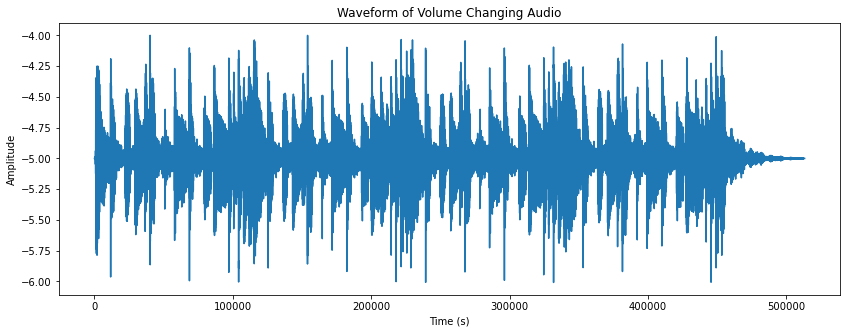

In [78]:
# Decrease volume by 5 dB
augmented_audio = original_audio - 5

plot_waveform(augmented_audio, "Waveform of Volume Changing Audio")

In [79]:
Audio(data=augmented_audio, rate=sample_rate)

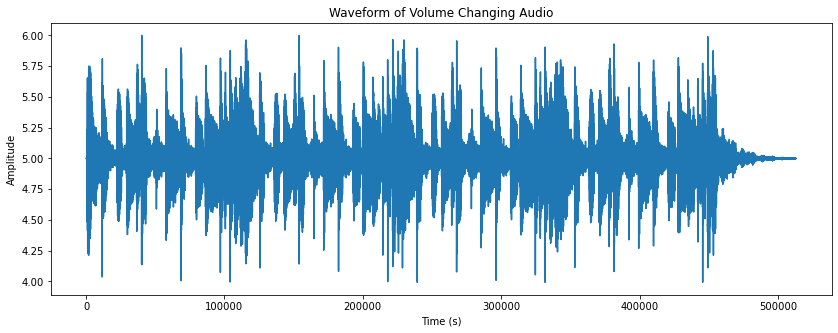

In [80]:
# Increase volume by 5 dB
augmented_audio = original_audio + 5

plot_waveform(augmented_audio, "Waveform of Volume Changing Audio")

In [81]:
Audio(data=augmented_audio, rate=sample_rate)

#### 2.4.2 Spectrograms (Frequency Domain)

A spectrogram is a visual representation of the frequency and amplitude (loudness) of an audio signal over time. It is created by converting the one-dimensional array of amplitude values and the sampling rate of the audio into a two-dimensional image. Spectrograms provide a detailed view of the frequency content in the audio, making it easier to analyze musical elements, detect patterns, and identify frequency-based effects. They are valuable for both musical and non-musical signal analysis, helping to recognize noise, interference, and other aspects of the audio signal.

You can convert audio in waveform into a Mel spectrogram with the `melspectrogram()` and `power_to_db()` methods from the librosa library.

In [82]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

In [83]:
# Load the original audio
PATH = "data/smooth-ac-guitar-loop-93bpm-137706.mp3"
original_audio, sample_rate = librosa.load(PATH)

# Compute the mel spectrogram of the original audio
original_melspec = librosa.feature.melspectrogram(y=original_audio,
                                                  sr=sample_rate,
                                                  n_fft=2048,
                                                  hop_length=512,
                                                  n_mels=128).T

original_melspec = librosa.power_to_db(original_melspec)

In [84]:
# Plot the spectrogram
def plot_spectrogram(melspec):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(melspec, x_axis='time', y_axis='mel', sr=sample_rate, hop_length=256)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram of Audio')
    plt.tight_layout()
    plt.show()

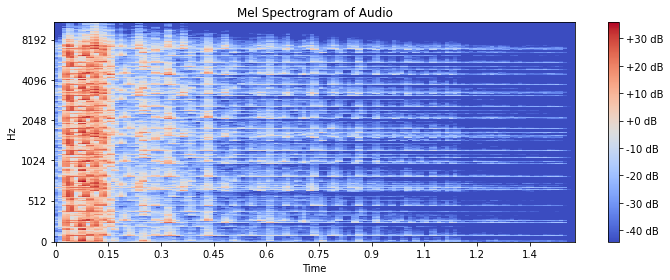

In [85]:
plot_spectrogram(original_melspec)

The spectrogram is a visual representation of audio data, where time is represented on the x-axis and frequency on the y-axis, much like an image. Spectrogram data augmentation involves three main techniques: time warping, frequency masking, and time masking. These methods are inspired by the research paper by [Park et al. 2019](https://arxiv.org/pdf/1904.08779.pdf), which you can refer to for further details.

**(1) Time Warping**

Time Warping is a data augmentation technique used for audio data. It involves randomly selecting a point in the audio and warping it either to the left or right with a distance chosen from a uniform distribution between 0 and a time warp parameter "W".

Here's a code example using the librosa library to apply time warping to a mel spectrogram.

In [86]:
# Choose a random point to start the time warp
num_frames = original_melspec.shape[1]
start_frame = np.random.randint(0, num_frames)

# Choose a random warp distance within a certain range
warp_distance = np.random.randint(0, 20)

# Apply the time warp by shifting the values in the spectrogram
warped_melspec = np.roll(original_melspec, warp_distance, axis=1)

In this code, we choose a random point to start the time warp, and a random warp distance within a certain range. Then we apply the time warp by shifting the values in the spectrogram using `np.roll()`. 

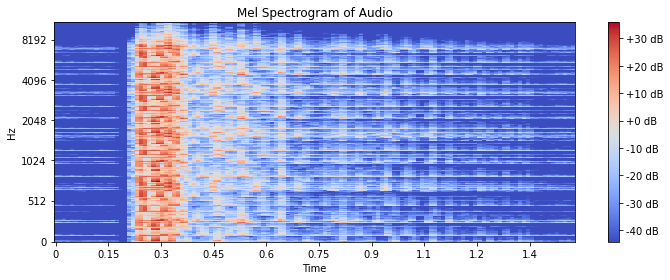

In [87]:
plot_spectrogram(warped_melspec)

**(2) Frequency Masking**

Frequency Masking is a data augmentation technique used in spectrograms. It involves masking a continuous range of frequency channels [f0, f0 + f), where f is randomly chosen from a uniform distribution between 0 and a frequency mask parameter F. The starting frequency f0 is also randomly chosen from the range (0, ν − f), where ν is the total number of frequency channels.

Code example for applying Frequency Masking to a mel spectrogram.

In [104]:
# Apply Frequency Masking
def apply_frequency_mask(spec, F=30):
    f = np.random.uniform(low=0, high=F)
    f0 = np.random.uniform(low=0, high=spec.shape[0] - f)
    mask = np.zeros_like(spec)
    mask[int(f0):int(f0+f), :] = 1
    masked_spec = spec * mask
    return masked_spec

masked_melspec = apply_frequency_mask(original_melspec)

# Convert to dB scale
log_masked_melspec = librosa.power_to_db(masked_melspec, ref=np.max)

In this code example, we apply frequency masking using the `apply_frequency_mask` function, where "F" is the frequency mask parameter. Then, we convert both the original and masked mel spectrograms to the dB scale using `librosa.power_to_db`.

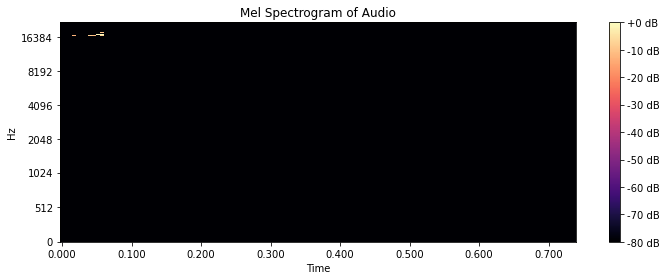

In [105]:
plot_spectrogram(log_masked_melspec)

**(3) Time Masking**

Time Masking is a data augmentation technique used in spectrograms. It involves masking t consecutive time steps [t0, t0 + t), where t is randomly chosen from a uniform distribution between 0 and a time mask parameter T. The starting time t0 is also randomly chosen from the range [0, τ − t), where τ is the total number of time steps in the spectrogram.

Code example for applying Time Masking to a mel spectrogram.

In [106]:
# Apply Time Masking
def apply_time_mask(spec, T=30):
    t = np.random.uniform(low=0, high=T)
    t0 = np.random.uniform(low=0, high=spec.shape[1] - t)
    mask = np.zeros_like(spec)
    mask[:, int(t0):int(t0+t)] = 1
    masked_spec = spec * mask
    return masked_spec

masked_melspec = apply_time_mask(original_melspec)

# Convert to dB scale
log_masked_melspec = librosa.power_to_db(masked_melspec, ref=np.max)

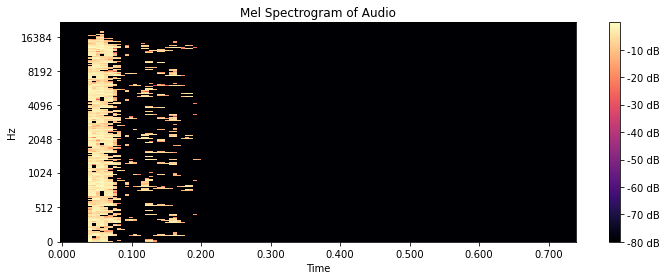

In [107]:
plot_spectrogram(log_masked_melspec)

In this code, we apply Time Masking using the `apply_time_mask function`, where "T" is the time mask parameter. Then, we convert both the original and masked mel spectrograms to the dB scale using `librosa.power_to_db`.

Alternatively, if you are using Pytorch, you could also use the TimeMasking and FrequencyMasking augmentations from `torchaudio`.

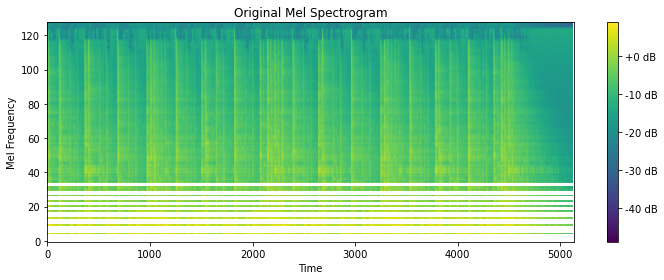

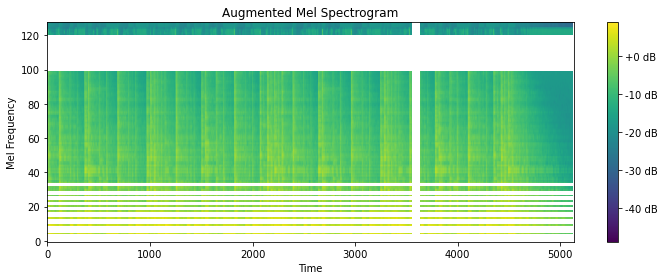

In [100]:
import torch
import torchaudio
import torchaudio.transforms as T
import matplotlib.pyplot as plt

# Load the audio waveform
PATH = "data/smooth-ac-guitar-loop-93bpm-137706.mp3"
waveform, sample_rate = torchaudio.load(PATH)

# Compute the mel spectrogram
mel_transform = T.MelSpectrogram(sample_rate=sample_rate)
mel_spectrogram = mel_transform(waveform)

# Function to plot the mel spectrogram
def plot_mel_spectrogram(spec, title):
    plt.figure(figsize=(10, 4))
    plt.imshow(torch.log(spec), cmap='viridis', origin='lower', aspect='auto')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Mel Frequency')
    plt.tight_layout()
    plt.show()

# Plot the original mel spectrogram
plot_mel_spectrogram(mel_spectrogram[0], 'Original Mel Spectrogram')

# Apply Time Masking and Frequency Masking
time_masking = T.TimeMasking(time_mask_param=80)
freq_masking = T.FrequencyMasking(freq_mask_param=80)
augmented_mel_spectrogram = time_masking(mel_spectrogram)
augmented_mel_spectrogram = freq_masking(augmented_mel_spectrogram)

# Plot the augmented mel spectrogram
plot_mel_spectrogram(augmented_mel_spectrogram[0], 'Augmented Mel Spectrogram')

## 3. Conclusion

In this notebook, we explored data augmentation's importance in machine learning modeling. We learned about its benefits and how it extends datasets for better model accuracy. We have explored various data types, including tabular, image, text, and audio data, and witnessed firsthand the power of data augmentation in extending datasets. Throughout the workshop, we gained a deep understanding of different data augmentation techniques and their applications in diverse scenarios. From generating new features from tabular data, image flipping, and rotation to text substitution and audio data augmentations. Now equipped with this knowledge, you can confidently use data augmentation to enhance your machine learning models and tackle real-world challenges effectively.

If you are interested in exploring advanced techniques such as Generative Adversarial Networks (GANs) for data augmentation, we invite you to attend our  [Generative Networks Workshop](https://practicumai.org/courses/gan/). This workshop will provide insights and hands-on experience in utilizing GANs for augmenting datasets.

***

## Bonus Exercises

We will use the `%load` command to load the content of a specified file into the cell, primarily for the purpose of incorporating solutions once you have finished the exercises.

### E1: RandomGrayscale
In this exercise, you will utilize `transforms.RandomGrayscale` function to convert the image to grayscale. The parameter settings for `RandomGrayscale` are as follows:

p: The probability of transforming the image to grayscale. Feel free to experiment with different values for p. You can set p to 1.0 or try out other values as per your preference.

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
# Load the image
image_path = 'images/04/cat.jpg' 
# image source: https://www.nationalgeographic.com/animals/mammals/facts/domestic-cat
image = Image.open(image_path, mode='r')

# Define the RandomGrayscale transformation with a probability of 1.0
transform = transforms.Compose([
            ```code it```
])

# Apply the transformation to the image
transformed_image = transform(image)

In [ ]:
# Display the original and transformed images using matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(transformed_image)
plt.title("Transformed Image")
plt.axis('off')

plt.show()

**Solution**

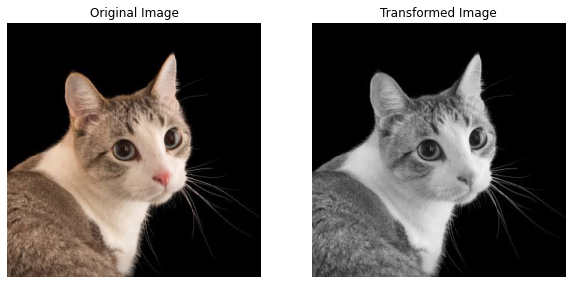

In [24]:
%load solutions/04.3_randomgrayscale

### E2: Synonym Replacement

In this exercise, we will randomly choose n non-stop words from the sentence and replace each of these words with a random synonym.

To achieve this, we'll use the `synonym_replacement` function from the `textaugment` library. TextAugment is a Python 3 library designed to enhance text for natural language processing tasks. It works seamlessly with other popular libraries like NLTK, Gensim, and TextBlob.

The main objective is to apply the `synonym_replacement` function to perform synonym replacement on a given test text. The function takes the test text as input and provides an augmented version of the text where certain words have been replaced with their synonyms.

In [ ]:
#!pip install textaugment

In [ ]:
from textaugment import EDA
eda_augment = EDA()
TEST_TEXT = "The sun is shining brightly in the clear blue sky."
syn_augmented = ```code it```

print("ORIGINAL Text :",TEST_TEXT)
print("AUGMENTED TEXT:", syn_augmented)

**Solution**

In [10]:
%load solutions/04.3_synonym_replacement

ORIGINAL Text : The sun is shining brightly in the clear blue sky.
AUGMENTED TEXT: The sun is clamber brightly in the clear blue sky.


### E3: Changing Speed

In this exercise, we want you to reduce the speed of the audio using the `time_stretch()` method from the `librosa` library.

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

# Define a function to plot the waveform
def plot_waveform(audio, title):
    plt.figure(figsize=(14, 5))
    plt.plot(audio)
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

In [ ]:
# Load the original audio
PATH = "data/pigeons-flying-6351.mp3" 
original_audio, sample_rate = librosa.load(PATH)

# Plot the audio waveform
plot_waveform(original_audio, "Waveform of Original Audio")

# Reduce the aduio speed
speed_factor = 0.5
augmented_audio = ```code it```

# Plot the augment audio waveform
plot_waveform(augmented_audio, "Waveform of Augmented Audio")

In [ ]:
# Play the audio
from IPython.display import Audio

Audio(data=augmented_audio, rate=sample_rate)

**Solution**

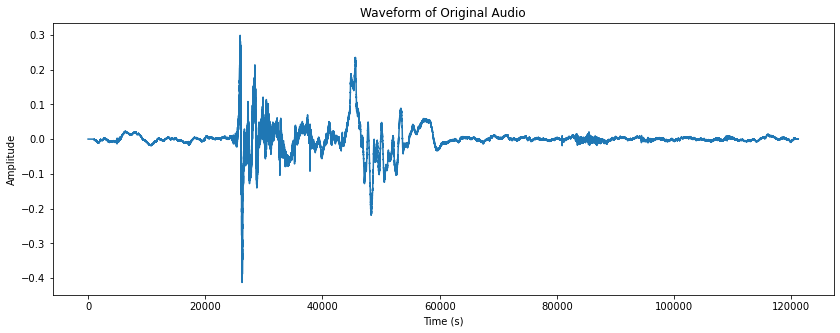

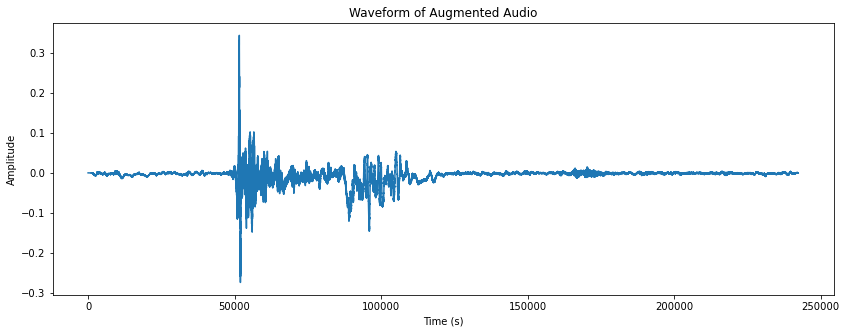

In [109]:
%load solutions/04.3_reduce_speed